# Fake Image Detection with ELA and CNN

Agus Gunawan, Holy Lovenia, Adrian Hartanto Pramudita

For more information: [Indonesian documentation](https://github.com/agusgun/FakeImageDetector/blob/master/docs/Deteksi%20Pemalsuan%20Gambar%20dengan%20ELA%20dan%20Deep%20Learning.pdf)

![full-architecture](docs/model-architecture.jpg "Architecture")

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
%matplotlib inline

np.random.seed(2)

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
import itertools

from keras.utils.np_utils import to_categorical # convert to one-hot-encoding
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D
from keras.optimizers import RMSprop
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ReduceLROnPlateau, EarlyStopping

sns.set(style='white', context='notebook', palette='deep')

## Initial preparation

In [2]:
from PIL import Image
import os
from pylab import *
import re
from PIL import Image, ImageChops, ImageEnhance

#### Functions

In [3]:
def get_imlist(path):
    return [os.path.join(path,f) for f in os.listdir(path) if f.endswith('.jpg') or f.endswith('.png')]

In [3]:
imglist=get_imlist('D:\others\project\CASIA\casia\Training\Au')
print(imglist[14000])

NameError: name 'get_imlist' is not defined

In [4]:
def convert_to_ela_image(path, quality):
    filename = path
    resaved_filename = filename.split('.')[0] + '.resaved.jpg'
    ELA_filename = filename.split('.')[0] + '.ela.png'
    
    im = Image.open(filename).convert('RGB')
    im.save(resaved_filename, 'JPEG', quality=quality)
    resaved_im = Image.open(resaved_filename)
    
    ela_im = ImageChops.difference(im, resaved_im)
    
    extrema = ela_im.getextrema()
    max_diff = max([ex[1] for ex in extrema])
    if max_diff == 0:
        max_diff = 1
    scale = 255.0 / max_diff
    
    ela_im = ImageEnhance.Brightness(ela_im).enhance(scale)
    
    return ela_im

### Sample: Real Image

Let's open a real (not-fake) image as a sample.

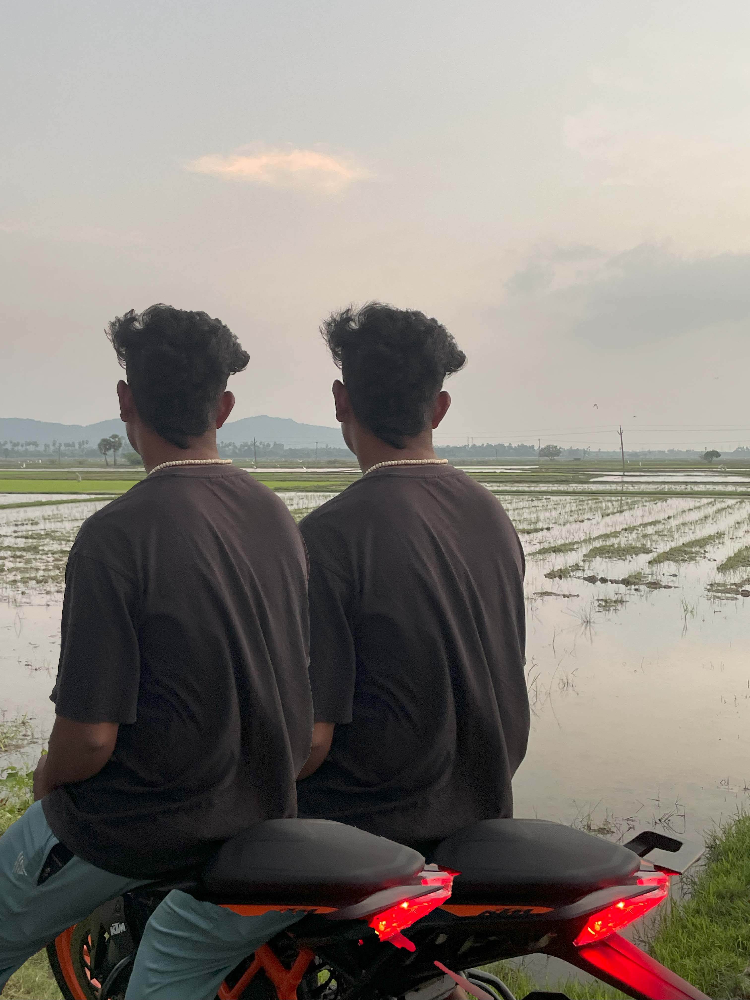

In [5]:
Image.open('D:\others\project\CASIA\check_images\image_test.jpg')

This is how it looks like after it is processed with error-level analysis (ELA).

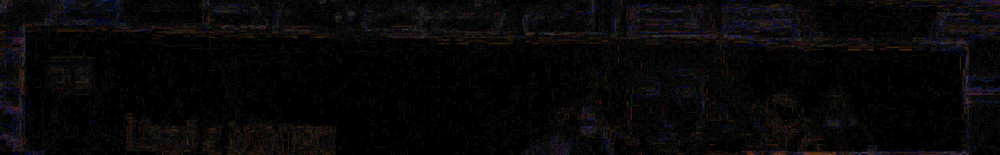

In [7]:
convert_to_ela_image("D:\others\project\CASIA\Dataset\TRAINING_CG-1050\TRAINING\TAMPERED\Im3_col2.jpg", 90)

### Sample: Fake Image

This is how it looks like after it has been edited.

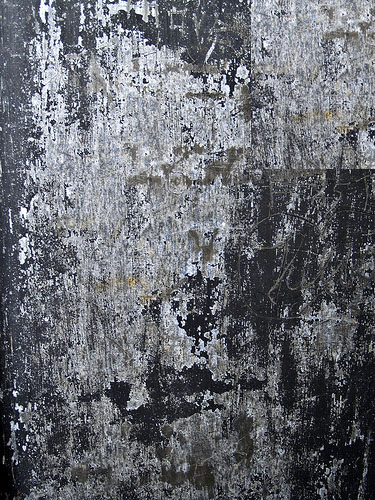

In [8]:
Image.open("D:\others\project\FakeImageDetector\casia\Training\Tp\Tp_S_NRN_S_N_txt10109_txt10109_10814.jpg")

This is the result of the fake image after getting through ELA. We can compare the difference between the picture below and the real picture's ELA result.

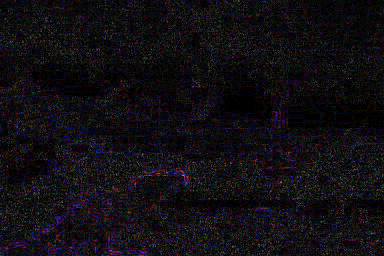

In [9]:
convert_to_ela_image("casia\Training\Tp\Tp_D_NRN_S_N_ani00051_ani00019_11857.jpg", 90)

With our own naked eyes, we are able to differ which is the ELA result of the real picture and which one is the result of fake image. By saying real here, what we mean is a non-CGI picture that is not fabricated/edited in any way, e.g. splicing.

## Data preparation

### Read dataset and conversion to ELA

In [5]:
dataset = pd.read_csv('D:\others\project\FakeImageDetector\image_paths.csv')

In [6]:
X = []#absolute path
Y = []#subfoldername

In [7]:
for index, row in dataset.iterrows():
    X.append(array(convert_to_ela_image(row[0], 90).resize((128, 128))).flatten() / 255.0)
    Y.append(row[1])

In [8]:

print(X[1].shape)
print(len(X),len(Y))

(49152,)
9743 9743


In [21]:
for item in range(len(Y)):
    if Y[item] =="Au":
        Y[item]=0
    elif Y[item]=="Tp":
        Y[item]==1

C:\Users\HIMANESH\AppData\Local\Temp\ipykernel_47296\4255273990.py:2: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if Y[item] =="Au":
C:\Users\HIMANESH\AppData\Local\Temp\ipykernel_47296\4255273990.py:4: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  elif Y[item]=="Tp":


In [9]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
le=le.fit(Y)
Y=le.fit_transform(Y)
print(Y)
print(type(Y))
print(Y.shape)

[0 0 0 ... 1 1 1]
<class 'numpy.ndarray'>
(9743,)


In [10]:
print(X[1].shape)

(49152,)


### Normalization

In [11]:

X = np.array(X)
Y = to_categorical(Y, 2)
print(type(Y))
print(type(X))
print(Y.shape,X.shape,Y[1])

<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
(9743, 2) (9743, 49152) [1. 0.]


In [18]:
print(X.shape)

(9743, 49152)


### Reshape X

In [12]:
X = X.reshape(-1, 128, 128, 3)
print(X.shape)

(9743, 128, 128, 3)


In [20]:
print(X.shape)

(9743, 128, 128, 3)


## Train-test split

In [21]:
X_train, X_val, Y_train, Y_val = train_test_split(X, Y, test_size = 0.2, random_state=5)

In [22]:
print(type(X_train))
print(X_train.shape)
print(Y_train.shape)
print(X_val.shape,Y_val.shape)

<class 'numpy.ndarray'>
(7794, 128, 128, 3)
(7794, 2)
(1949, 128, 128, 3) (1949, 2)


## CNN building

In [5]:
model = Sequential()

model.add(Conv2D(filters = 32, kernel_size = (5,5),padding = 'valid', 
                 activation ='relu', input_shape = (128,128,3)))
print("Input: ", model.input_shape)
print("Output: ", model.output_shape)

model.add(Conv2D(filters = 32, kernel_size = (5,5),padding = 'valid', 
                 activation ='relu'))
print("Input: ", model.input_shape)
print("Output: ", model.output_shape)

model.add(MaxPool2D(pool_size=(2,2)))

model.add(Dropout(0.25))
print("Input: ", model.input_shape)
print("Output: ", model.output_shape)

model.add(Flatten())
model.add(Dense(256, activation = "relu"))
model.add(Dropout(0.5))
model.add(Dense(2, activation = "softmax"))

NameError: name 'Sequential' is not defined

In [24]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 124, 124, 32)      2432      
                                                                 
 conv2d_1 (Conv2D)           (None, 120, 120, 32)      25632     
                                                                 
 max_pooling2d (MaxPooling2D  (None, 60, 60, 32)       0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 60, 60, 32)        0         
                                                                 
 flatten (Flatten)           (None, 115200)            0         
                                                                 
 dense (Dense)               (None, 256)               29491456  
                                                        

### Add optimizer

In [25]:
optimizer = RMSprop(lr=0.0005, rho=0.9, epsilon=1e-08, decay=0.0)


c:\Users\HIMANESH\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\optimizers\legacy\rmsprop.py:143: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


In [26]:
model.compile(optimizer = optimizer , loss = "categorical_crossentropy", metrics=["accuracy"])


### Define early stopping

In [27]:
early_stopping = EarlyStopping(monitor='val_accuracy',
                              min_delta=0,
                              patience=2,
                              verbose=0, mode='auto')

### Model training

In [28]:
from keras.callbacks import ModelCheckpoint
model_checkpoint = ModelCheckpoint('best_model.h5', 
                                   monitor='val_accuracy',  # Choose the metric to monitor
                                   save_best_only=True,  # Save only the best model
                                   mode='max',  # Save the model with the maximum value of the monitored metric
                                   verbose=1)

In [29]:
epochs = 10
batch_size = 32

In [31]:
history = model.fit(X_train, Y_train, batch_size = batch_size, epochs = epochs, 
          validation_data = (X_val, Y_val), verbose = 2, callbacks=[early_stopping,model_checkpoint])

KeyboardInterrupt: 

In [1]:
def preprocess_input_image(image_path):
    # Load the image and perform ELA conversion
    ela_image = convert_to_ela_image(image_path, 90)
    
    # Resize and normalize the image
    resized_image = ela_image.resize((128, 128))
    input_data = np.array(resized_image).flatten() / 255.0
    
    # Reshape the input data
    input_data = input_data.reshape(-1, 128, 128, 3)
    
    return input_data

In [2]:
def predict_input_image(model, image_path):
    # Preprocess the input image
    input_data = preprocess_input_image(image_path)
    
    # Use the trained model to make predictions
    predictions = model.predict(input_data)
    
    # Convert softmax scores to class labels
    predicted_class = np.argmax(predictions, axis=1)
    
    return predicted_class

In [3]:
input_image_path = 'D:\others\project\CASIA\casia\Testing\Au_ani_0053.jpg'

predicted_class = predict_input_image(model, input_image_path)
print("Predicted Class:", predicted_class)

NameError: name 'model' is not defined